In [1]:
from deep_traffic_generation.tcvae_pairs_disent import TCVAE_Pairs_disent
from deep_traffic_generation.VAE_Generation import PairsVAE
from traffic.algorithms.generation import Generation
from deep_traffic_generation.core.datasets import TrafficDatasetPairsRandom
from traffic.core import Traffic

from sklearn.preprocessing import MinMaxScaler
import torch
import numpy as np
from os import walk

In [2]:
# import torch.nn.functional as F
# from torch.distributions.beta import Beta 
# from torch.distributions.kumaraswamy import Kumaraswamy
# from torch.distributions import Independent

# SMALL = 1e-16

# a = np.log(np.exp(5) - 1) #inverse softplus
# b = np.log(np.exp(1.) - 1) #inverse softplus
# beta_a = torch.Tensor(10).zero_() + a
# beta_b = torch.Tensor(10).zero_() + b
# beta_a = F.softplus(beta_a) + 0.01
# beta_b = F.softplus(beta_b) + 0.01

# beta_a_ext = beta_a.view(1, 10).expand(5, 10) 
# beta_b_ext = beta_b.view(1, 10).expand(5, 10)

# # v = Kumaraswamy(beta_a_ext, beta_b_ext).sample()
# kuma_dist = Independent(Kumaraswamy(beta_a_ext, beta_b_ext),1)
# v_test = kuma_dist.rsample()

# beta_dist = Independent(Beta(beta_a_ext, beta_b_ext),1)

In [2]:
dataset = TrafficDatasetPairsRandom.from_file(
    ("../deep_traffic_generation/data/training_datasets/to_LSZH_16_50_bb.pkl", "../deep_traffic_generation/data/training_datasets/ga_LSZH_14_50_bb.pkl"),
    features=["track", "groundspeed", "altitude", "timedelta"],
    n_samples = 10000,
    scaler=MinMaxScaler(feature_range=(-1,1)),
    # scaler=None,
    shape="image",
    info_params={"features": ["latitude", "longitude"], "index": -1},
)

In [3]:
path = "../deep_traffic_generation/lightning_logs/tcvae_pairs_disent/version_22/"

t = PairsVAE(X = dataset, vae_type="TCVAEPairs_disent", sim_type = "generation")
t.load(path, dataset.parameters)
g = Generation(generation=t, features = t.VAE.hparams.features, scaler=dataset.scaler) 

In [2]:
traffic_to = Traffic.from_file("../deep_traffic_generation/data/training_datasets/to_LSZH_16_50_bb.pkl")
latlon = traffic_to.data.groupby(by="flight_id")[["latitude", "longitude"]].first()
print("Take-offs:", latlon.latitude.mean(), latlon.longitude.mean())

traffic_ga = Traffic.from_file("../deep_traffic_generation/data/training_datasets/ga_LSZH_14_50_bb.pkl")
latlon = traffic_ga.data.groupby(by="flight_id")[["latitude", "longitude"]].first()
print("Go-Arounds:", latlon.latitude.mean(), latlon.longitude.mean())

Take-offs: 47.44463545742907 8.557321498760901
Go-Arounds: 47.500085790354625 8.5114919243637


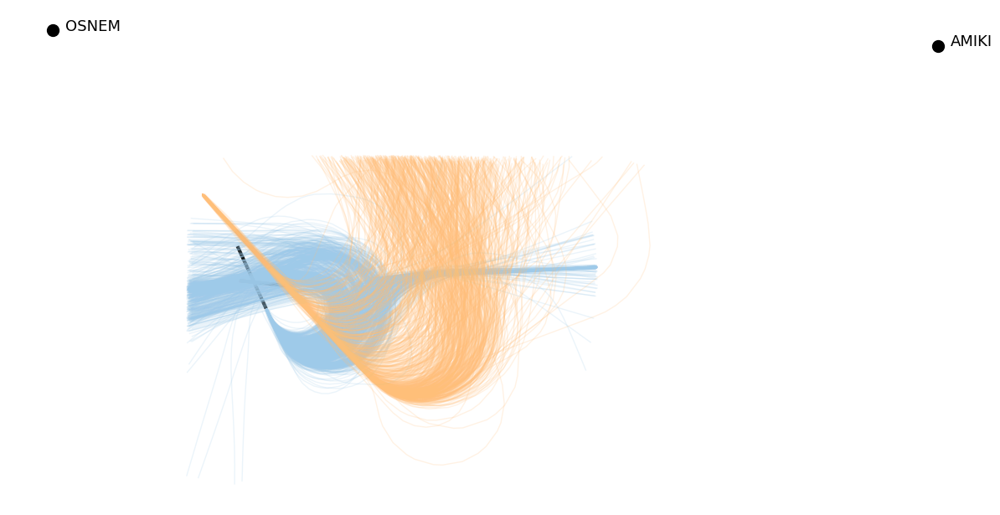

In [5]:
import matplotlib.pyplot as plt
from traffic.core.projection import EuroPP
from traffic.data import navaids, airports

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(15, 10), subplot_kw=dict(projection=EuroPP()))

    traffic_to[:1000].plot(ax, alpha=0.2, color = "#9ecae9")
    traffic_ga.plot(ax, alpha = 0.2, color = "#ffbf79")

    airports["LSZH"].plot(ax, footprint=False, runways=dict(lw=1), labels=False)
    navaids["OSNEM"].plot(ax)
    navaids["AMIKI"].plot(ax)

plt.show()

# Latent Space

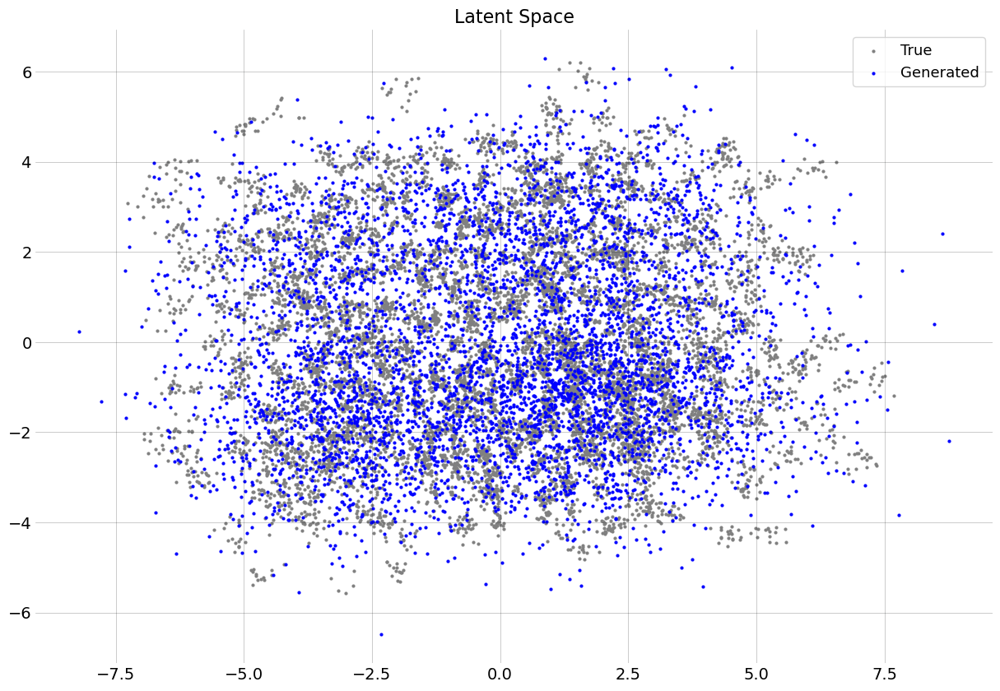

In [4]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

n_gen = 5000
Z, Z_gen = t.latent_space(n_gen)

#Only fitted on train data
pca = PCA(n_components=2).fit(Z)
Z_emb = pca.transform(Z)
if len(Z_gen.shape) == 3:
    Z_gen_emb = pca.transform(Z_gen.squeeze(2))
else:
    Z_gen_emb = pca.transform(Z_gen)

with plt.style.context("traffic"):
    fig, ax = plt.subplots(1, figsize=(15, 10))
    ax.scatter(Z_emb[:, 0], Z_emb[:, 1], s=4, c ='grey', label = "True")
    ax.scatter(Z_gen_emb[:, 0], Z_gen_emb[:, 1], s=4, c='blue', label = "Generated")
    
    ax.title.set_text("Latent Space")
    ax.legend()

    plt.show()

Mistmatch quite important between aggregated posterior and prior:
- Try to increase the TC regularization term to enforce the factorisation -> 1st experiment
- Try to increase the dimension-wise KL reg to enforce the match between the marginals -> 2nd Experiment
- The Mutual Information has little to no influence
- If it's not sufficient, add a regularization over KL(agg.post | prior) as in Disentengling Disentanglement -> 3rd experiment (Bien parce que même estimation de q(z) que celle qu'on utilise jusque là) 
- If it still doesn't work, we can try to use VampPrior, but adding a constrain that forces VampPrior to be factorised (independant copula, or minimizing the TC)
- We can also try to use a more refined prior as in Disentengling Disentanglement -> 5th experiment

# Reconstruction

5151


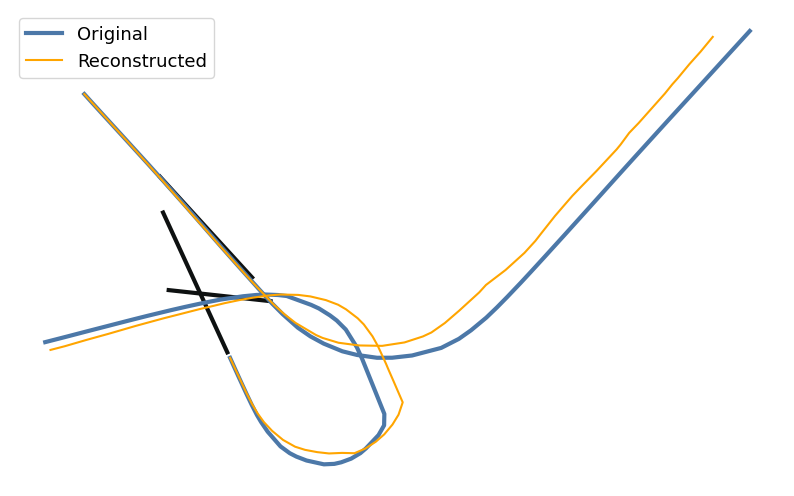

In [10]:
from traffic.core.projection import EuroPP
from traffic.data import airports
from traffic.drawing import countries
import matplotlib.pyplot as plt

j = np.random.randint(len(dataset))
print(j)

#Original trajectories
original1 = dataset.data1[j].unsqueeze(0)
original1 = original1.transpose(1,2).reshape((original1.shape[0], -1))
original2 = dataset.data2[j].unsqueeze(0)
original2 = original2.transpose(1,2).reshape((original2.shape[0], -1))
original = torch.cat((original1, original2), dim = 1)
original = dataset.scaler.inverse_transform(original)
original_traf_to = g.build_traffic(original[:,:original1.shape[1]], coordinates = dict(latitude =  47.44464, longitude = 8.55732), forward=True)
original_traf_ga = g.build_traffic(original[:,original2.shape[1]:], coordinates = dict(latitude = 47.500086, longitude = 8.51149), forward=True)

#Latest variables
h1 = t.VAE.encoder_traj1(dataset.data1[j].unsqueeze(0))
h2 = t.VAE.encoder_traj2(dataset.data2[j].unsqueeze(0))
h = torch.cat((h1, h2), dim = 1)
z = t.VAE.lsr(h).rsample()

#Reconstruction
decoded = t.decode(z)
reconstructed_traf_to = g.build_traffic(decoded[:,:200], coordinates = dict(latitude =  47.44464, longitude = 8.55732), forward=True)
reconstructed_traf_ga = g.build_traffic(decoded[:,200:], coordinates = dict(latitude = 47.500086, longitude = 8.51149), forward=True)


with plt.style.context("traffic"):
    fig, ax = plt.subplots(1, subplot_kw=dict(projection=EuroPP()))
    original_traf_to.plot(ax, c="#4c78a8", lw = 3, label = "Original")
    original_traf_ga.plot(ax, c="#4c78a8", lw = 3)
    reconstructed_traf_to.plot(ax, c="orange", label = "Reconstructed")
    reconstructed_traf_ga.plot(ax, c="orange")
    plt.legend()

    airports["LSZH"].plot(ax, footprint=False, runways=dict(lw=1), labels=False)

    plt.show()
    
# original_traf_to[0] | reconstructed_traf_to[0] | original_traf_ga[0] | reconstructed_traf_ga[0]

# Generation

In [24]:
n_gen = 200

p_z = t.VAE.lsr.get_prior()
z_gen = p_z.sample(torch.Size([n_gen])).squeeze(1)
if len(z_gen.shape) == 3:
    z_gen = z_gen.squeeze(2)
gen = t.decode(z_gen)

gen_traf_to = g.build_traffic(gen[:,:200], coordinates = dict(latitude =  47.44464, longitude = 8.55732), forward=True)
gen_traf_ga = g.build_traffic(gen[:,200:], coordinates = dict(latitude = 47.500086, longitude = 8.51149), forward=True)

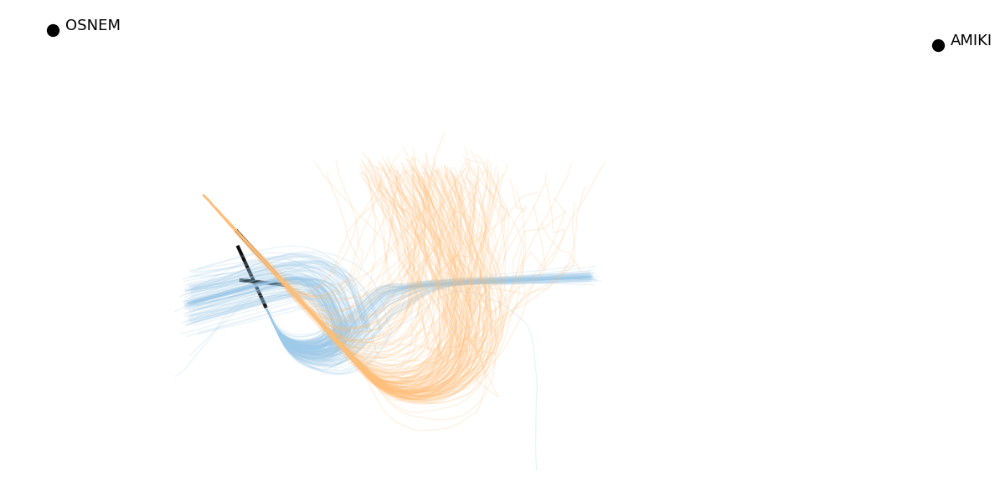

In [25]:
import matplotlib.pyplot as plt
from traffic.core.projection import EuroPP
from traffic.data import navaids, airports

with plt.style.context("traffic"):
    fig, ax = plt.subplots(figsize=(15, 10), subplot_kw=dict(projection=EuroPP()))

    gen_traf_to.plot(ax, alpha=0.2, color = "#9ecae9")
    gen_traf_ga.plot(ax, alpha = 0.2, color = "#ffbf79")

    airports["LSZH"].plot(ax, footprint=False, runways=dict(lw=1), labels=False)
    navaids["OSNEM"].plot(ax)
    navaids["AMIKI"].plot(ax)

plt.show()

# Disentanglement

In [13]:
h1 = t.VAE.encoder_traj1(dataset.data1)
h2 = t.VAE.encoder_traj2(dataset.data2)
h = torch.cat((h1, h2), dim = 1)
q = t.VAE.lsr(h)
means, scales = t.VAE.lsr.dist_params(q)[0].detach().numpy(), t.VAE.lsr.dist_params(q)[1].detach().numpy()

#Low variance = inactive latent dimensions
val, c = np.unique(scales, return_counts=True)
c

array([567,   1,   1, ...,   1,   1,   1])

In [27]:
probs_dim, means_dim, scales_dim = p_z.base_dist.mixture_distribution.probs.detach().numpy(), p_z.base_dist.component_distribution.base_dist.loc.squeeze(2).detach().numpy(), p_z.base_dist.component_distribution.base_dist.scale.squeeze(2).detach().numpy()

pz_means, pz_scales = [], []

for i in range(len(probs_dim)):
    tmp_mean = (probs_dim[i]*means_dim[i]).sum()
    tmp_scale = (probs_dim[i]*scales_dim[i]**2).sum() + probs_dim[i].prod()*np.diff(means_dim[0])**2
    pz_means.append(tmp_mean)
    pz_scales.append(np.sqrt(tmp_scale.item()))


#Interesting to notice that the learned gaussian mixture prior is closed to the standard gaussian prior

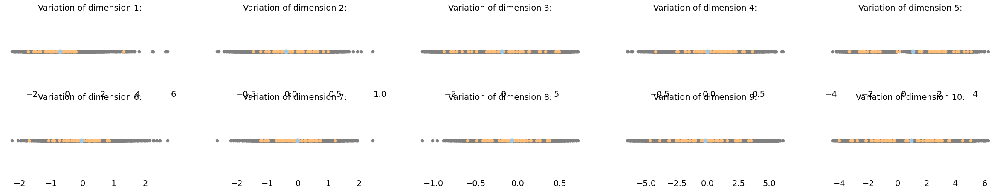

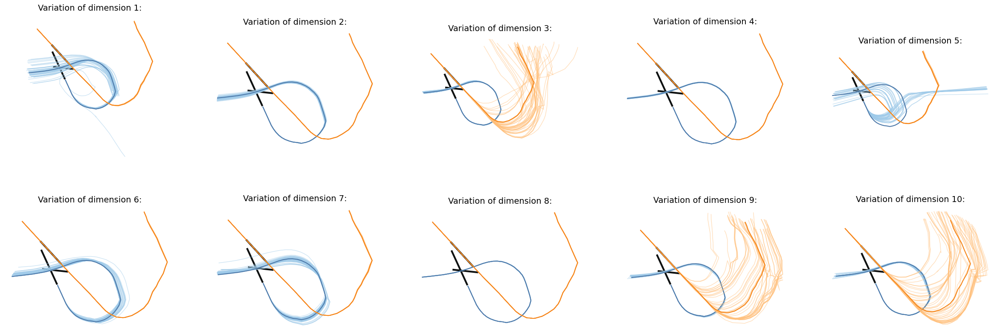

In [28]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

from torch.distributions import (Independent, Normal)
from traffic.core.projection import EuroPP
from traffic.data import navaids, airports

tos = []
gas = []
latents = []

#Pb: on tire aléatoirement un point dans la prior, puis on fait varier chaque dimension autour de ce point
#Si le point tiré est au "bord" de la prior, certains autres points tirés seront complètement en dehors de la prior, et donc les trajectoires générées hors champs. 
#Ne faudrait-il pas tirer séparément dans chacune des dimensions de la prior séparément ? 

#Base point is a random point in the latent space
# p = p_z.sample(torch.Size([1])).squeeze(1)
# if len(p.shape) == 3:
#     p = p.squeeze(2)
    
#Base point is the mean of the prior
p = torch.Tensor(pz_means).unsqueeze(0)

n_gen = 50

#Variations around each dimension
for i in range(p.shape[1]):
    z0 = p.repeat(n_gen,1)
    # To show disentanglement, either I take +/- 3std around the randomly sampled point p, or I simply sample separately in each dimension and p is the mean
    # z0[:,i] = torch.linspace(z0[0,i]-3*pz_scales[i] , z0[0,i]+3*pz_scales[i], n_gen)
    z0[:,i] = p_z.sample(torch.Size([n_gen]))[:,i,:].squeeze(1)
    z0 = torch.vstack((p, z0))
    latents.append(z0)
    gen0 = t.decode(torch.Tensor(z0))
    to = g.build_traffic(gen0[:,:200], coordinates = dict(latitude =  47.44464, longitude = 8.55732), forward=True).iterate_lazy().resample("1s").cumulative_distance().eval()
    tos.append(to)
    ga = g.build_traffic(gen0[:,200:], coordinates = dict(latitude = 47.500086, longitude = 8.51149), forward=True).iterate_lazy().resample("1s").cumulative_distance().eval()
    gas.append(ga)

with plt.style.context("traffic"):
    fig1, ax1 = plt.subplots(2, 5, figsize=(30, 5))
    
    for i in range(p.shape[1]):
        ax1[i//5,i%5].scatter(Z[:, i], np.zeros_like(Z[:, i]), s=20, c ='grey', label = "True")
        ax1[i//5,i%5].scatter(latents[i][:, i], np.zeros_like(latents[i][:, i]), s=20, c="#ffbf79", label = "Generated")
        ax1[i//5,i%5].scatter(latents[i][0, i], np.zeros_like(latents[i][0, i]), s=40, c="#9ecae9", label = "Sampled")
        ax1[i//5,i%5].set_title('Variation of dimension {}:'.format(i+1), fontsize = 14)
        ax1[i//5,i%5].grid(False)
        ax1[i//5,i%5].set_yticks([])
        # ax1[i//5,i%5].set_xticks([])

with plt.style.context("traffic"):
    fig2, ax2 = plt.subplots(2, 5, figsize=(30, 10), subplot_kw=dict(projection=EuroPP()))
    
    for i in range(p.shape[1]):
        tos[i].plot(ax2[i//5,i%5], color="#9ecae9", alpha = 0.5)
        tos[i]["TRAJ_0"].plot(ax2[i//5,i%5], color="#4c78a8", alpha = 1)
        gas[i].plot(ax2[i//5,i%5], color="#ffbf79", alpha = 0.5)
        gas[i]["TRAJ_0"].plot(ax2[i//5,i%5], color="#f58518", alpha = 1)
        airports["LSZH"].plot(ax2[i//5,i%5], footprint=False, runways=dict(lw=1), labels=False)
        ax2[i//5,i%5].set_title('Variation of dimension {}:'.format(i+1), fontsize = 14)

    plt.show()

In [30]:

#I've choosen time for the x-axis, but it could be cumdist (however looks less relevant here)

import altair as alt

#Number of the dimension displayed above
j = 5

chart1 = alt.layer(
    *(
        flight.chart().encode(
            x=alt.X(
                "timestamp:T",
                axis=alt.Axis(tickCount= 10),
                title="Time (CET)",
            ),
            y=alt.Y("altitude", title=None),
            opacity=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value(1),
                alt.value(0.5),
            ),
            color=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value("#4c78a8"),
                alt.value("#9ecae9"),
            ),
        )
        for flight in tos[j-1]
    )
).properties(title="Altitude (in ft)", width=800, height=500)

chart2 = alt.layer(
    *(
        flight.chart().encode(
            x=alt.X(
                "timestamp:T",
                axis=alt.Axis(tickCount= 10),
                title="Time (CET)",
            ),
            y=alt.Y("groundspeed", title=None),
            opacity=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value(1),
                alt.value(0.5),
            ),
            color=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value("#4c78a8"),
                alt.value("#9ecae9"),
            ),
        )
        for flight in tos[j-1]
    )
).properties(title="Ground speed (in kts)", width=800, height=500)

chart3 = alt.layer(
    *(
        flight.chart().encode(
            x=alt.X(
                "timestamp:T",
                axis=alt.Axis(tickCount= 10),
                title="Time (CET)",
            ),
            y=alt.Y("altitude", title=None),
            opacity=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value(1),
                alt.value(0.5),
            ),
            color=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value("#f58518"),
                alt.value("#ffbf79"),
            ),
        )
        for flight in gas[j-1]
    )
).properties(title="Altitude (in ft)", width=800, height=500)

chart4 = alt.layer(
    *(
        flight.chart().encode(
            x=alt.X(
                "timestamp:T",
                axis=alt.Axis(tickCount= 10),
                title="Time (CET)",
            ),
            y=alt.Y("groundspeed", title=None),
            opacity=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value(1),
                alt.value(0.5),
            ),
            color=alt.condition(
                alt.datum.flight_id == "TRAJ_0",
                alt.value("#f58518"),
                alt.value("#ffbf79"),
            ),
        )
        for flight in gas[j-1]
    )
).properties(title="Ground speed (in kts)", width=800, height=500)

plots = (chart1 + chart3) | (chart2 + chart4)

plots

alt.HConcatChart(...)